In [1]:
#check the environment
import sys
print(sys.executable)

/Users/ekaterinazaitseva/.local/share/virtualenvs/MLZoomCamp_UberPricePrediction-6KM0SWNI/bin/python


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import KFold

In [4]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
import time

In [27]:
import folium
from folium.plugins import HeatMap

In [50]:
from sklearn.feature_selection import RFE 

**Main steps we will walk through in this dataset**
* Get the data
* Explore and visualise data to gain insights
* Prepare the data for ML algorithms
* Select a model and train it
* Fine-tune the selected model

## Reading data

The goal of this analysis is to find features which may help us to predict the most fair price for the Uber ride considering other variables like distance, surge multiplier, weather conditions, time of the day, day of the week, month of the year, etc.

* First, we will select features and do EDA analysis to further filter the list
* After that we will train several models to predict the price and choose the best one

In [5]:
df = pd.read_csv('inputs/rideshare_kaggle.csv')
df.head(3).T

,0,1,2
id,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,4bd23055-6827-41c6-b23b-3c491f24e74d,981a3613-77af-4620-a42a-0c0866077d1e
timestamp,1544952607.89,1543284023.677,1543366822.198
hour,9,2,1
day,16,27,28
month,12,11,11
datetime,2018-12-16 09:30:07,2018-11-27 02:00:23,2018-11-28 01:00:22
timezone,America/New_York,America/New_York,America/New_York
source,Haymarket Square,Haymarket Square,Haymarket Square
destination,North Station,North Station,North Station
cab_type,Lyft,Lyft,Lyft


Before going to EDA, what we can see from the first glance?
* timestamp seems to be different date type and needs a transformation
* datetime also looks like a string
* all columns that contain `Time` are integers

Let's think which features we may drop from the first iteration of our model. E.g.
* Detailed information about temperature like apparentTemperatureHigh, apparentTemperatureHighTime, apparentTemperatureLow, dewPoint, etc.
* moonPhase
* Text features like short_summary and long_summary

In [6]:
df.columns

Index(['id', 'timestamp', 'hour', 'day', 'month', 'datetime', 'timezone',
       'source', 'destination', 'cab_type', 'product_id', 'name', 'price',
       'distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparentTemperature', 'short_summary', 'long_summary',
       'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperat

In [7]:
drop_cols = ['timezone', 'product_id', 'short_summary', 'long_summary', 'windGustTime', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime', 'icon',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperatureMax', 'apparentTemperatureMaxTime']

df2 = df.drop(drop_cols, axis=1)
df2.columns = df2.columns.str.replace(' ', '_').str.lower()
df2 = df2.set_index('id')

## Data split

We will start from splitting the data at such an early stage to avoid overfitting: if we include at the test set as well, we may stumble upon some seemingly interesting pattern that can bias our decision and produce *data snooping* bias.

In [8]:
random_seed = 42

In [9]:
df_full_train, df_test = train_test_split(df2, test_size=0.2, random_state=random_seed)
len(df_full_train), len(df_test)

(554456, 138615)

## EDA

In [10]:
df_full_train.sample(5)

,timestamp,hour,day,month,datetime,source,destination,cab_type,name,price,...,latitude,longitude,temperature,apparenttemperature,precipintensity,precipprobability,humidity,windspeed,windgust,visibility
id,,,,,,,,,,,,,,,,,,,,,
fce1e2f4-f9c8-43f3-afd6-92ac821da3da,1.543476e+09,7,29,11,2018-11-29 07:22:58,Haymarket Square,West End,Uber,UberPool,6.5,...,42.3588,-71.0707,38.80,32.47,0.0,0.0,0.68,9.30,13.82,9.980
863c41ed-a629-4d0d-bff0-b5daec5b4bba,1.543406e+09,11,28,11,2018-11-28 11:56:07,Theatre District,Fenway,Uber,Taxi,NaN,...,42.3647,-71.0542,35.54,30.98,0.0,0.0,0.73,5.31,7.20,9.933
07f74cce-7a91-4e90-ba5e-c9482db37b2a,1.543443e+09,22,28,11,2018-11-28 22:05:07,Beacon Hill,Boston University,Lyft,Shared,2.5,...,42.3647,-71.0542,40.43,34.59,0.0,0.0,0.64,9.08,12.72,10.000
780469ca-2858-4d11-8c31-185a2871f225,1.543448e+09,23,28,11,2018-11-28 23:41:07,South Station,Theatre District,Lyft,Lyft XL,13.5,...,42.2148,-71.0330,39.35,33.00,0.0,0.0,0.69,9.63,14.39,10.000
178d0d84-dc9c-4b3c-acf6-a64c0b137109,1.544939e+09,5,16,12,2018-12-16 05:45:05,Haymarket Square,Back Bay,Uber,WAV,10.5,...,42.3505,-71.1054,40.30,36.80,0.0,0.0,0.70,5.04,6.98,10.000


In [11]:
df_full_train.shape

(554456, 22)

* We have columns like id, timestamp, hour, day, month, datetime, and timezone that are related to the time of the ride.
* There are source and destination details like source, destination, cab_type, product_id, and name.
* The target variable is price.
* There are features related to the distance and conditions of the ride such as distance, surge_multiplier, latitude, longitude.
* Weather-related features are also present: temperature, apparenttemperature, precipintensity, precipprobability, humidity, windspeed, windgust, visibility

### Missing values

In [12]:
df_full_train.isnull().sum()

timestamp                  0
hour                       0
day                        0
month                      0
datetime                   0
source                     0
destination                0
cab_type                   0
name                       0
price                  44165
distance                   0
surge_multiplier           0
latitude                   0
longitude                  0
temperature                0
apparenttemperature        0
precipintensity            0
precipprobability          0
humidity                   0
windspeed                  0
windgust                   0
visibility                 0
dtype: int64

In [13]:
print(f'Percentage of missing values in price column {round(df_full_train.isnull().sum().sum()*100/df_full_train.shape[0],2)}%')

Percentage of missing values in price column 7.97%


We have missing values only in one column (but the most important one which we will try to predict) and it's about ~8%. For the simplicity, we will drop these values

In [14]:
df_full_train = df_full_train.dropna()

In [15]:
df_full_train.columns

Index(['timestamp', 'hour', 'day', 'month', 'datetime', 'source',
       'destination', 'cab_type', 'name', 'price', 'distance',
       'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparenttemperature', 'precipintensity', 'precipprobability',
       'humidity', 'windspeed', 'windgust', 'visibility'],
      dtype='object')

In [16]:
df_full_train['timestamp'] = pd.to_datetime(df_full_train['timestamp'], unit='s')
df_full_train['datetime'] = pd.to_datetime(df_full_train['datetime'])

In [17]:
numerical_cols = ['price', 'distance', 'temperature', 'humidity', 'precipintensity', 'visibility']
cat_cols = ['source', 'destination', 'cab_type', 'name']
time_cols = ['hour', 'day']

In [18]:
def plot_univariate(df, list_vars):

    sns.set_style("whitegrid")
    plt.figure(figsize=(15, 10))
    for v in range(len(list_vars)):
        plt.subplot(3, 2, v+1)
        sns.histplot(df[list_vars[v]], bins=50, kde=False)
        plt.title(f'Distribution of {list_vars[v]}')
        plt.xlabel(f'{list_vars[v]}')
        plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

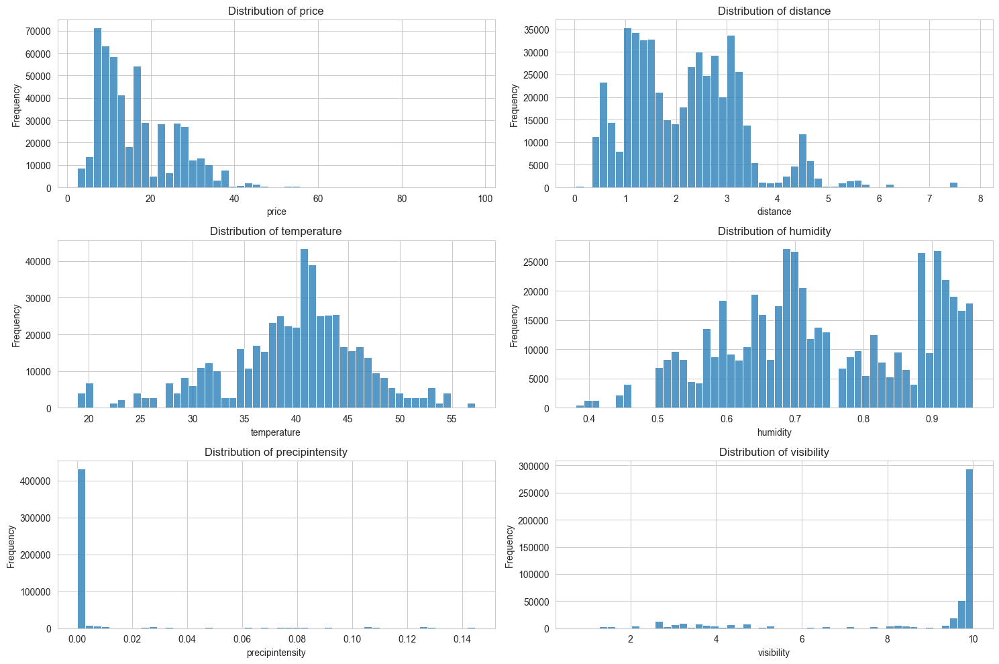

In [20]:
plot_univariate(df_full_train, numerical_cols)

* Price: The distribution of price shows a right-skewed pattern, meaning most of the rides fall within a lower price range, but the distribution looks also bimodal and there are some rides that are more expensive (20-40)
* Distance: The distribution is also right-skewed, indicating that most rides are short, but there are a few longer ones
* Temperature: The temperature seems to have a bimodal distribution with two peaks, suggesting that the data might span across seasons
* Humidity: The distribution of humidity is slightly left-skewed, with most of the values clustering around higher humidity levels
* Precipitation intensity is highly right-skewed meaning that usually there is no precipitation
* Visibility on the opposite is left-skewed and scpre from 1 to 10 meaning that usually, the visibility is good, so we definitely don't deal with rainy countries (:

In [21]:
def plot_categorical(df, list_vars, limit_cols=10):

    sns.set_style("whitegrid")
    plt.figure(figsize=(20, 15))
    for v in range(len(list_vars)):
        plt.subplot(2, 2, v+1)
        sns.countplot(data=df, y=list_vars[v], hue=list_vars[v],
                      order=df[list_vars[v]].value_counts().iloc[:limit_cols].index, palette='Spectral')
        plt.title(f'Count Distribution of {list_vars[v]}')
        plt.xlabel(f'{list_vars[v]}')
        plt.ylabel('Count')

    plt.tight_layout()
    plt.show()

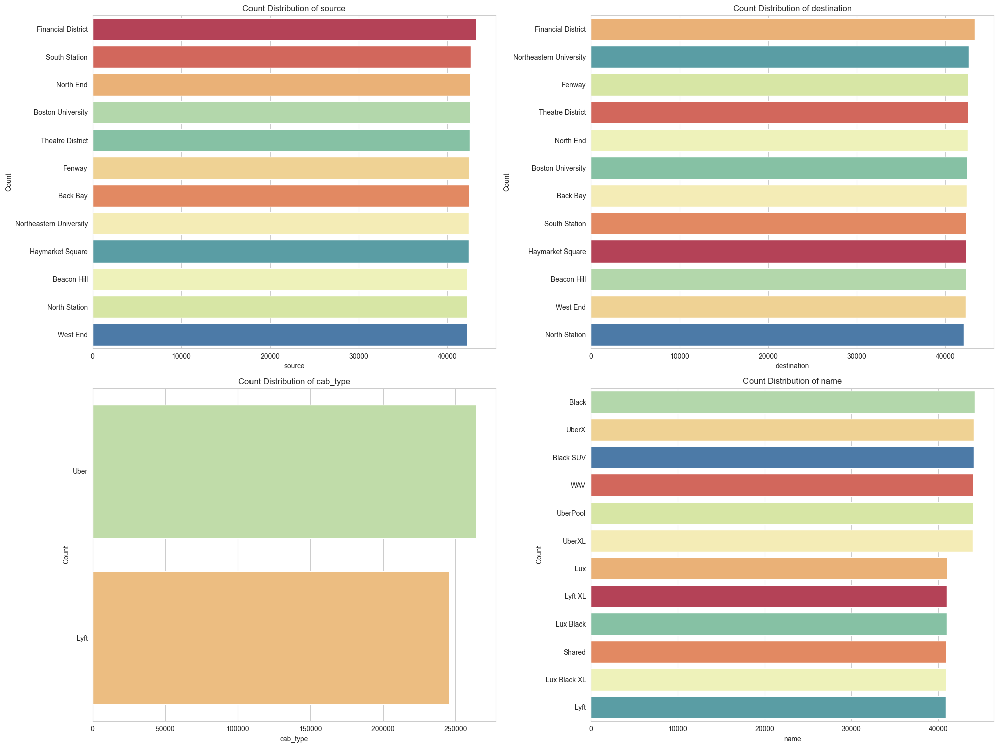

In [22]:
plot_categorical(df_full_train, cat_cols, 15)

* Cab Type: It appears that the number of Uber rides is somewhat higher than the number of Lyft rides in this dataset
* Ride Name: Various ride options are available, with some options being more popular than others. The top ride names in the dataset include WAV, Black, UberXL, and Lux but they are more or less equally distributed
* Source and Destination: Certain locations are more popular as either starting points or destinations. For instance, Haymarket Square and North Station are among the top sources and destinations for rides but they are also more or else equally distributed

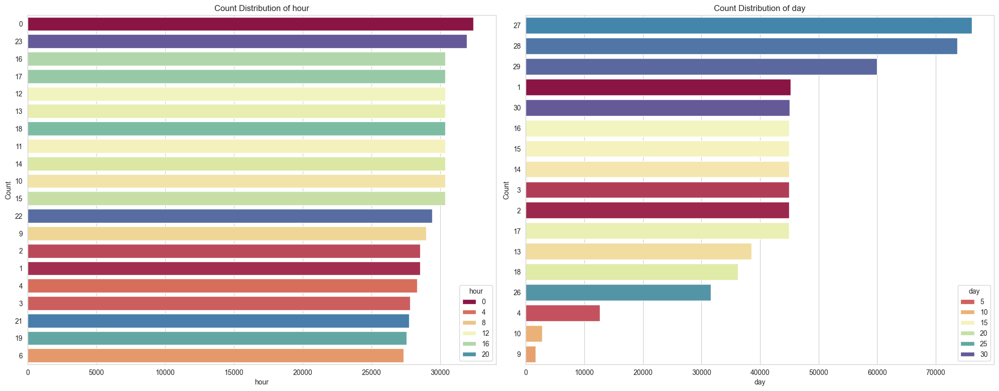

In [23]:
plot_categorical(df2, time_cols, 20)

* Hour: Most popular time for the cab is actually around midnight and the least popular being at 7pm and 6am
* Day: With days the distribution is even more interesting, most of the rides in 2 months happened mostly in the end of the month or in the first days of the month. This may have an impact on the price

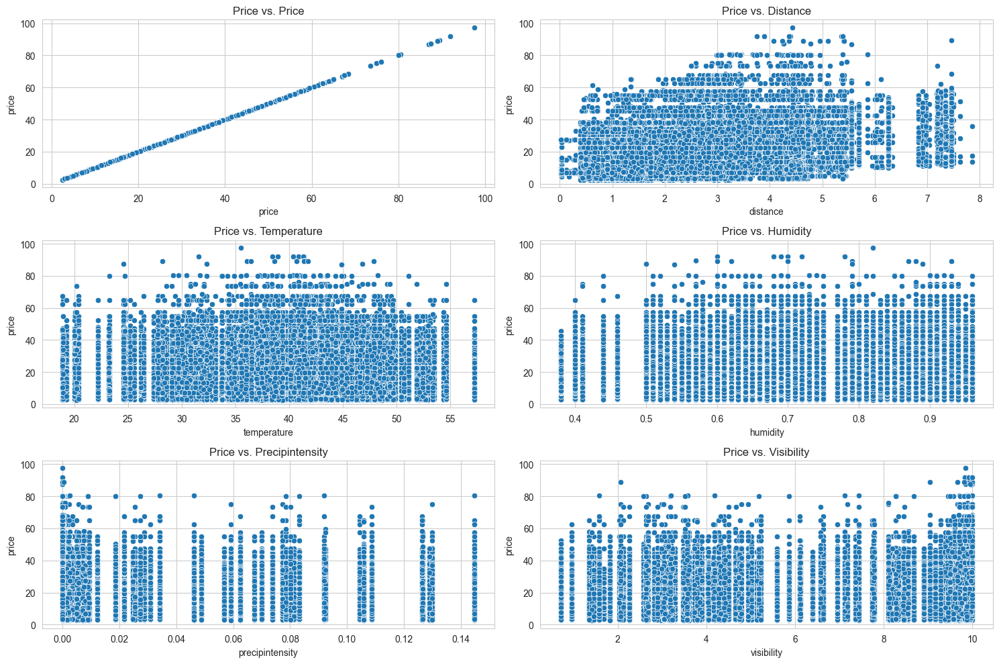

In [24]:
# Plotting the relationship between 'price' and selected numerical features
plt.figure(figsize=(15, 10))

for i, feature in enumerate(numerical_cols, 1):
    plt.subplot(3, 2, i)
    sns.scatterplot(x=df_full_train[feature], y=df_full_train['price'])
    plt.title(f'Price vs. {feature.capitalize()}')

plt.tight_layout()
plt.show()

* Price vs. Distance: There seems to be a positive relationship between distance and price, which is expected. Longer rides tend to cost more
* Price vs. Temperature: There doesn't seem to be a strong or clear relationship between temperature and price
* Price vs. Humidity: Similar to temperature, there's no clear relationship between humidity and price
* Price vs. Precipitation intensity: Interesting that regardless of precipitations the price doesn't increase or decrease
* Price vs. Visibility: Same goes for visibility

Which means that some of these features can add only noise and maybe it's better to use just one parameter - surge_multiplier which already accumulates all this information

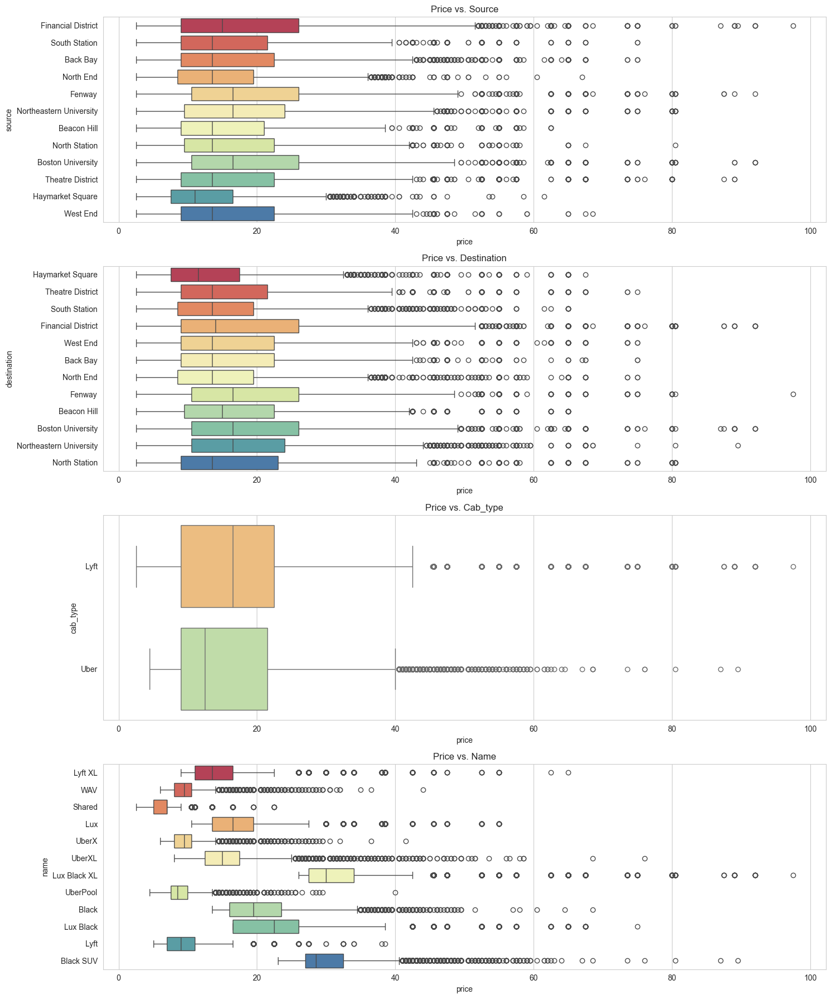

In [25]:
plt.figure(figsize=(15, 18))

for i, feature in enumerate(cat_cols, 1):
    plt.subplot(4, 1, i)
    sns.boxplot(x='price', y=feature, data=df_full_train, hue=feature, palette='Spectral')
    plt.title(f'Price vs. {feature.capitalize()}')

plt.tight_layout()
plt.show()

* Cab Type: Lyft on avg. is more expensive but Uber has much more outliers
* **Name (type of the taxi car)**: has an impact on the price where the most expensive is Lux Black XL
* Source: The median price varies slightly across different sources. Some locations have a broader range of prices, indicating variability in the cost of rides starting from those locations
* Destination: Similar to the source, the median price varies across different destinations. Some destinations also exhibit a wide range of prices

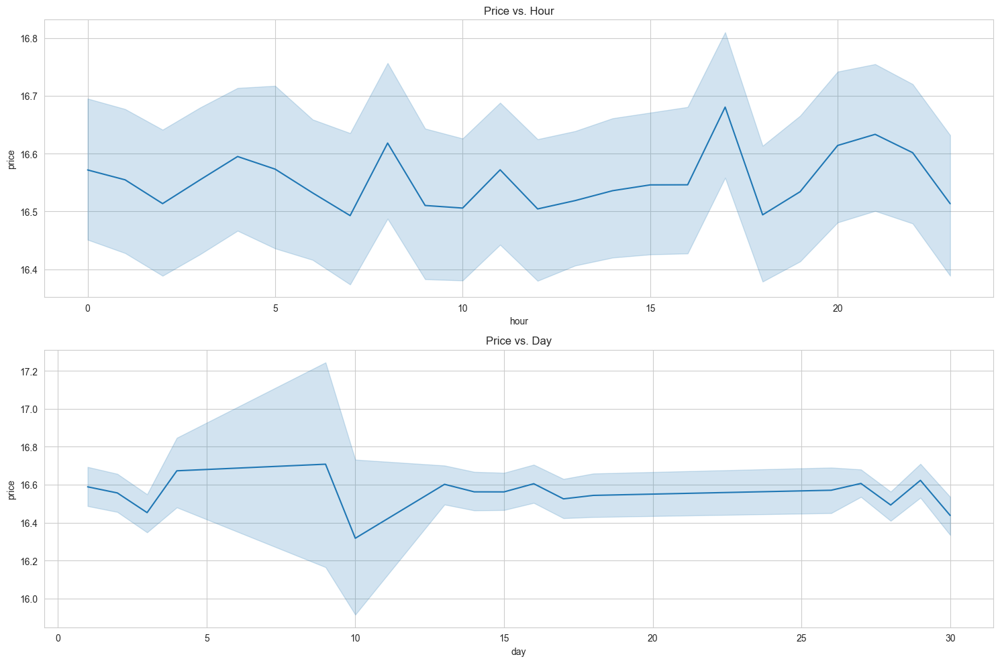

In [26]:
plt.figure(figsize=(15, 10))

for i, feature in enumerate(time_cols, 1):
    plt.subplot(2, 1, i)
    sns.lineplot(x=feature, y='price', data=df_full_train)
    plt.title(f'Price vs. {feature.capitalize()}')

plt.tight_layout()
plt.show()

* **Hour**: There are fluctuations in price throughout the day. Prices tend to be higher during certain hours, possibly indicating peak times for rides (8-9am and 17pm - before and after work)
* **Day**: The price shows some variability throughout the month, but there isn't a clear or consistent trend. Some days have higher average prices, which could be due to specific events or demand patterns

In [28]:
m = folium.Map(location=[df_full_train['latitude'].mean(), df_full_train['longitude'].mean()], zoom_start=12)

heat_data = [[row['latitude'], row['longitude'], row['price']] for index, row in df_full_train.iterrows()]

HeatMap(heat_data, radius=15).add_to(m)

In [29]:
# To display the map in a Jupyter notebook
m

In [30]:
m.save("heatmap.html")

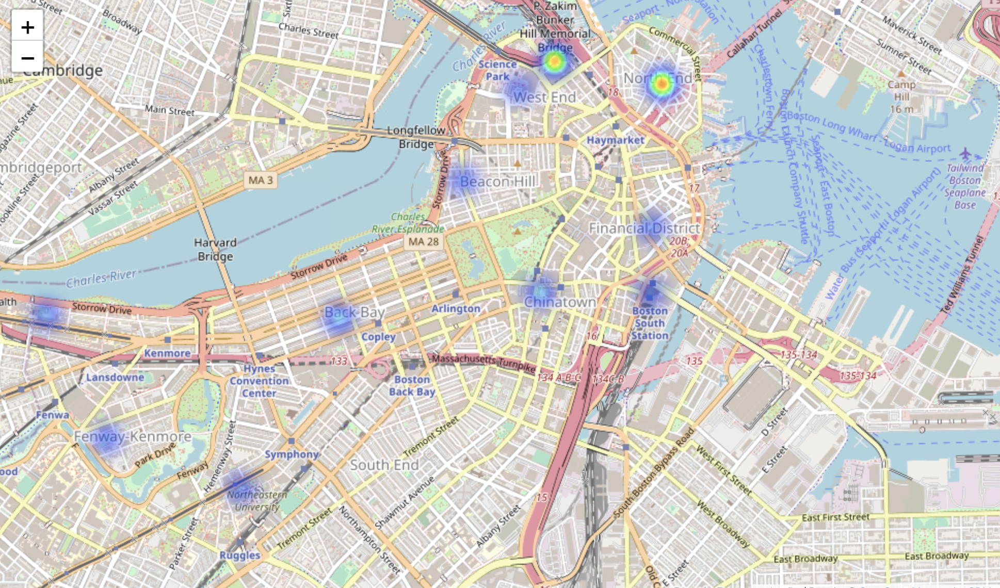

It seems that there are neighbourhoods with a price higher than average (close to Hill Memorial Bridge)

In [31]:
df_full_train.columns

Index(['timestamp', 'hour', 'day', 'month', 'datetime', 'source',
       'destination', 'cab_type', 'name', 'price', 'distance',
       'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparenttemperature', 'precipintensity', 'precipprobability',
       'humidity', 'windspeed', 'windgust', 'visibility'],
      dtype='object')

In [32]:
numerical_cols = ['price','distance', 'surge_multiplier', 'latitude', 'longitude', 'temperature',
       'apparenttemperature', 'precipintensity', 'precipprobability',
       'humidity', 'windspeed', 'windgust', 'visibility']

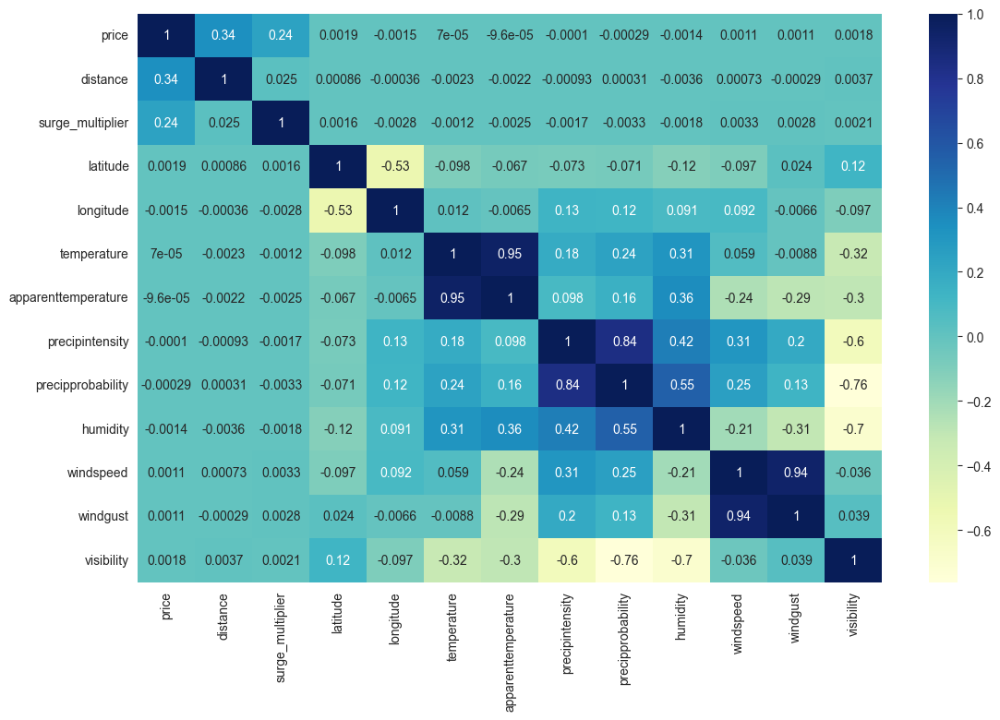

In [33]:
plt.figure(figsize=(13, 8))
dataplot = sns.heatmap(df_full_train[numerical_cols].corr(), cmap="YlGnBu", annot=True)
plt.show()

In [34]:
df_full_train[numerical_cols].corr()['price']

price                  1.000000
distance               0.344998
surge_multiplier       0.241173
latitude               0.001927
longitude             -0.001523
temperature            0.000070
apparenttemperature   -0.000096
precipintensity       -0.000101
precipprobability     -0.000295
humidity              -0.001400
windspeed              0.001120
windgust               0.001118
visibility             0.001756
Name: price, dtype: float64

## Feature Engineering

**Recap of importance of categorical features**

* Cab Type: Lyft on avg. is more expensive but Uber has much more outliers
* **Name (type of the taxi car)**: has an impact on the price where the most expensive is Lux Black XL
* Source: The median price varies slightly across different sources. Some locations have a broader range of prices, indicating variability in the cost of rides starting from those locations
* Destination: Similar to the source, the median price varies across different destinations. Some destinations also exhibit a wide range of prices

**Recap of importance of time features**

* Hour: Most popular time for the cab is actually around midnight and the least popular being at 7pm and 6am
* Day: With days the distribution is even more interesting, most of the rides in 2 months happened mostly in the end of the month or in the first days of the month. This may have an impact on the price

In [35]:
df_full_train.name.value_counts()

name
Black           44215
UberX           44094
Black SUV       44091
WAV             44078
UberPool        44039
UberXL          44018
Lux             41044
Lyft XL         41016
Lux Black       40994
Shared          40919
Lux Black XL    40914
Lyft            40869
Name: count, dtype: int64

In [36]:
categorical_cols = ['source','name','hour', 'day']
df_full_train_cat = df_full_train[categorical_cols]

In [37]:
df_full_train_cat

,source,name,hour,day
id,,,,
8d84b6ea-0b71-45ec-9910-b1e3d8e18be3,Financial District,Lyft XL,5,3
8c793d15-5fda-4e5c-84a2-77c2484b315b,South Station,Lyft XL,19,3
2a186286-e9ee-4dce-8b49-a559551121b0,Financial District,WAV,9,28
41d984a5-ddfc-412d-a170-c3389f54f5bd,Back Bay,Shared,11,18
7b13785d-b0b7-4f5d-88bf-6c42de20db32,North End,Shared,0,18
...,...,...,...,...
0637705e-8a58-4c8b-81cc-825cbd4ef191,Fenway,UberX,15,14
0f3e15db-1276-4643-b318-c28e5a07e1b7,Haymarket Square,Lux Black,4,26
2e54081e-dfa9-4537-a232-5dc0c441a12b,South Station,Black,22,30


We will use OneHotEncoder for transforming columns since it remembers which categories it was trained on and will raise an exception when the new value appears rather than just create a column like get_dummies() do

In [38]:
cat_encoder = OneHotEncoder(sparse_output=False)

In [39]:
cat_encoder.fit_transform(df_full_train_cat)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [40]:
df_full_train_cat_1hot = pd.DataFrame(cat_encoder.transform(df_full_train_cat),
             columns=cat_encoder.get_feature_names_out(),
             index=df_full_train.index)
df_full_train_cat_1hot.head()

,source_Back Bay,source_Beacon Hill,source_Boston University,source_Fenway,source_Financial District,source_Haymarket Square,source_North End,source_North Station,source_Northeastern University,source_South Station,...,day_14,day_15,day_16,day_17,day_18,day_26,day_27,day_28,day_29,day_30
id,,,,,,,,,,,,,,,,,,,,,
8d84b6ea-0b71-45ec-9910-b1e3d8e18be3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8c793d15-5fda-4e5c-84a2-77c2484b315b,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2a186286-e9ee-4dce-8b49-a559551121b0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
41d984a5-ddfc-412d-a170-c3389f54f5bd,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7b13785d-b0b7-4f5d-88bf-6c42de20db32,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [41]:
train_cols = ['price', 'distance', 'surge_multiplier',
       'latitude', 'longitude', 'temperature', 'apparenttemperature',
       'precipintensity', 'precipprobability', 'humidity', 'windspeed',
       'windgust', 'visibility', 'source', 'name', 'hour', 'day']

In [42]:
df_full_train_with_cat = pd.concat([df_full_train[train_cols], df_full_train_cat_1hot], axis=1).drop(categorical_cols, axis=1)
df_full_train_with_cat.head()

,price,distance,surge_multiplier,latitude,longitude,temperature,apparenttemperature,precipintensity,precipprobability,humidity,...,day_14,day_15,day_16,day_17,day_18,day_26,day_27,day_28,day_29,day_30
id,,,,,,,,,,,,,,,,,,,,,
8d84b6ea-0b71-45ec-9910-b1e3d8e18be3,11.0,1.10,1.0,42.3398,-71.0892,45.78,45.78,0.0,0.0,0.94,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8c793d15-5fda-4e5c-84a2-77c2484b315b,11.0,1.18,1.0,42.3398,-71.0892,53.34,53.34,0.0,0.0,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2a186286-e9ee-4dce-8b49-a559551121b0,7.5,1.25,1.0,42.3429,-71.1003,34.26,30.15,0.0,0.0,0.79,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
41d984a5-ddfc-412d-a170-c3389f54f5bd,7.0,1.34,1.0,42.3661,-71.0631,24.71,12.26,0.0,0.0,0.51,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7b13785d-b0b7-4f5d-88bf-6c42de20db32,3.5,1.13,1.0,42.3559,-71.0550,37.97,32.71,0.0,0.0,0.70,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


## Feature Scaling and Transformation

In [43]:
std_scaler = StandardScaler()
df_full_train_std_scaled = std_scaler.fit_transform(df_full_train_with_cat)

In [44]:
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=random_seed)
len(df_train), len(df_val), len(df_test)

(382718, 127573, 138615)

In [45]:
y_full_train = df_full_train.price.values
y_train = df_train.price.values
y_val = df_val.price.values
y_test = df_test.price.values

df_train = df_train.drop(['price'], axis=1)
df_val= df_val.drop(['price'], axis=1)
df_test = df_test.drop(['price'], axis=1)

In [53]:
def prepare_df(df_train, df_val, cols):
    
    dv = DictVectorizer(sparse=False)
    std_scaler = StandardScaler()
    
    df_train = df_train[cols]
    df_val = df_val[cols]

    train_dict = df_train.to_dict(orient='records')
    X_train = dv.fit_transform(train_dict)
    X_train_std_scaled = std_scaler.fit_transform(X_train)

    val_dict = df_val.to_dict(orient='records')
    X_val = dv.transform(val_dict)
    X_val_std_scaled = std_scaler.fit_transform(X_val)
    
    return dv, X_train, X_val

## Training the baseline models

In [47]:
dv, X_train, X_val = prepare_df(df_train, df_val, ['distance'])
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_val)
rmse = mean_squared_error(y_val, lr_pred, squared=False)
mae = mean_absolute_error(y_val, lr_pred)
print(f"Linear Regression RMSE: {rmse}, MAE: {mae}")

Linear Regression RMSE: 8.772916647986552, MAE: 7.101652339829704


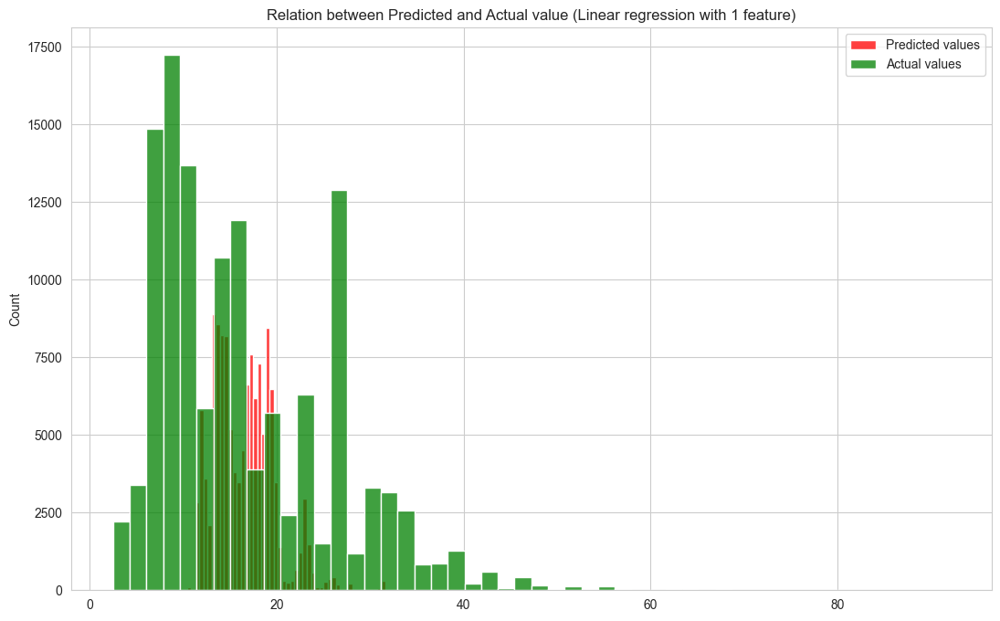

In [49]:
plt.figure(figsize=(13, 8))
sns.histplot(lr_pred, color="red", label='Predicted values', bins=50, kde=False)
sns.histplot(y_val, color="green", label='Actual values', bins=50, kde=False)
plt.title("Relation between Predicted and Actual value (Linear regression with 1 feature)")
plt.legend()
plt.show()

## Feature selection

In [51]:
train_cols = ['distance', 'surge_multiplier',
       'latitude', 'longitude', 'temperature', 'apparenttemperature',
       'precipintensity', 'precipprobability', 'humidity', 'windspeed',
       'windgust', 'visibility', 'source', 'name', 'hour', 'day']

In [54]:
dv, X_train, X_val = prepare_df(df_train, df_val, train_cols)
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_val)
rmse = mean_squared_error(y_val, lr_pred, squared=False)
mae = mean_absolute_error(y_val, lr_pred)
print(f"Linear Regression RMSE: {round(rmse,3)}, MAE: {round(mae,3)}")

Linear Regression RMSE: 2.512, MAE: 1.764


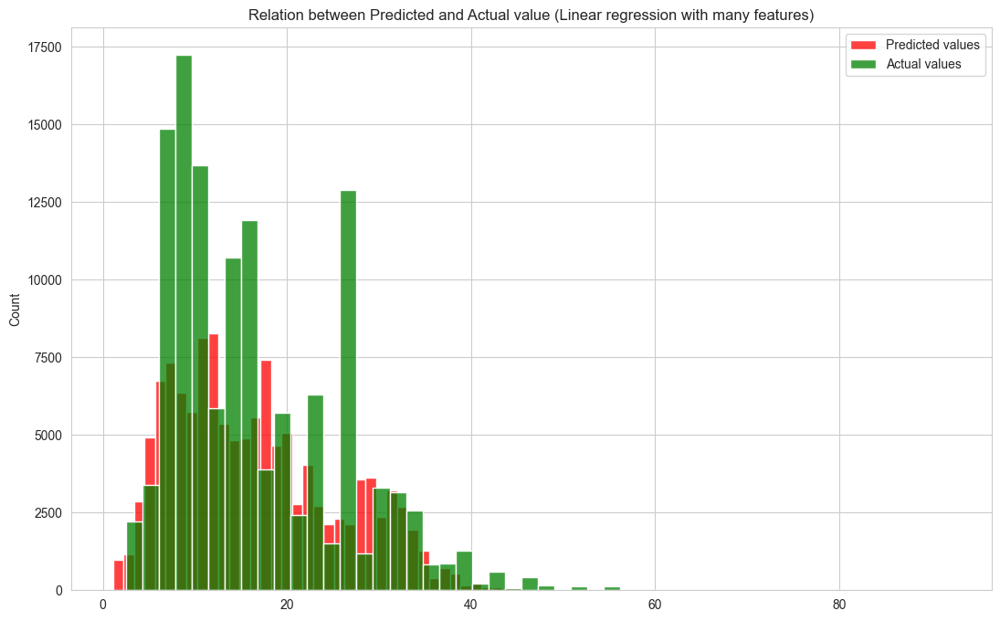

In [56]:
plt.figure(figsize=(13, 8))
sns.histplot(lr_pred, color="red", label='Predicted values', bins=50, kde=False)
sns.histplot(y_val, color="green", label='Actual values', bins=50, kde=False)
plt.title("Relation between Predicted and Actual value (Linear regression with many features)")
plt.legend()
plt.show()

In [57]:
feature_selection_df = []
def RFE_Function(n_features, X_train, y_train, X_val, y_val):
    lr = LinearRegression()
    rfe = RFE(lr , n_features_to_select = n_features)
    rfe = rfe.fit(X_train, y_train)
    selected_columns = dv.get_feature_names_out()[rfe.support_]
    selected_X_train = X_train[:, rfe.support_]
    #Fitting training data
    lr = lr.fit(selected_X_train, y_train)
    selected_X_val = X_val[:, rfe.support_]
    lr_pred = lr.predict(selected_X_val)
    rmse = mean_squared_error(y_val, lr_pred, squared=False)
    mae = mean_absolute_error(y_val, lr_pred)
    r_squared = lr.score(selected_X_val, y_val)
    print(f"For {n_features} features, MAE = {mae}, RMSE = {rmse}")
    feature_selection_df.append({'number_of_features':n_features,
                                 'MAE': mae, 
                                 'RMSE': rmse, 
                                 'R_squared': r_squared,
                                 'selected_columns':selected_columns})

In [58]:
dv, X_train, X_val = prepare_df(df_train, df_val, train_cols)

In [59]:
X_train.shape

(382718, 38)

In [60]:
%%time
for i in [10, 20, 30, 38]:
    RFE_Function(i, X_train, y_train, X_val, y_val)

For 10 features, MAE = 7.516780807286073, RMSE = 9.232361333615223
For 20 features, MAE = 3.042795488293957, RMSE = 4.289993547213279
For 30 features, MAE = 1.7635700306535775, RMSE = 2.5125041862072313
For 38 features, MAE = 1.763573150580279, RMSE = 2.512489562426425
CPU times: user 1min 17s, sys: 14.2 s, total: 1min 31s
Wall time: 29.3 s


With a feature selection mechanism, we can see that our model can operate successfully even with 30 features, for the simplicity let's keep all features for now

In [61]:
feature_selection = pd.DataFrame(feature_selection_df)
print(feature_selection[feature_selection.number_of_features==30]['selected_columns'].values)

[array(['distance', 'humidity', 'latitude', 'longitude', 'name=Black',
        'name=Black SUV', 'name=Lux', 'name=Lux Black',
        'name=Lux Black XL', 'name=Lyft', 'name=Lyft XL', 'name=Shared',
        'name=UberPool', 'name=UberX', 'name=UberXL', 'name=WAV',
        'precipintensity', 'source=Back Bay', 'source=Beacon Hill',
        'source=Boston University', 'source=Fenway',
        'source=Financial District', 'source=Haymarket Square',
        'source=North End', 'source=North Station',
        'source=Northeastern University', 'source=South Station',
        'source=Theatre District', 'source=West End', 'surge_multiplier'],
       dtype=object)                                                      ]


Since in our business, there can be high prices, and the model should also be able to detect them, as a future metric, we will choose only one - RMSE since it's more sensitive to 'outliers'

## Selecting the model

In [62]:
models_results = []

In [63]:
dv, X_train, X_val = prepare_df(df_train, df_val, train_cols)

In [64]:
def train_ridge_regression(X_train, y_train, X_val, y_val, reg_alpha=1.0):
    start_time = time.time()
    ridge = Ridge(alpha=reg_alpha)
    ridge.fit(X_train, y_train)
    ridge_pred = ridge.predict(X_val)
    end_time = time.time()
    rmse = mean_squared_error(y_val, ridge_pred, squared=False)
    time_count = end_time - start_time
    print(f"Ridge Regression with alpha {reg_alpha} RMSE: {rmse}")
    models_results.append({'model':f'ridge_regression_alpha_{reg_alpha}', 'RMSE': rmse, 'time_sec': time_count})

In [65]:
train_ridge_regression(X_train, y_train, X_val, y_val, reg_alpha=0.1)

Ridge Regression with alpha 0.1 RMSE: 2.51248995744274


In [66]:
train_ridge_regression(X_train, y_train, X_val, y_val, reg_alpha=1)

Ridge Regression with alpha 1 RMSE: 2.5124935688102017


In [67]:
train_ridge_regression(X_train, y_train, X_val, y_val, reg_alpha=10)

Ridge Regression with alpha 10 RMSE: 2.5125352139704087


In [68]:
train_ridge_regression(X_train, y_train, X_val, y_val, reg_alpha=0.01)

Ridge Regression with alpha 0.01 RMSE: 2.5124896018718026


With alpha = 0.1, the model is performing slightly better

In [69]:
def train_lasso_regression(X_train, y_train, X_val, y_val, reg_alpha=1.0):
    start_time = time.time()
    lasso = Lasso(alpha=reg_alpha)
    lasso.fit(X_train, y_train)
    lasso_pred = lasso.predict(X_val)
    end_time = time.time()
    rmse = mean_squared_error(y_val, lasso_pred, squared=False)
    time_count = end_time - start_time
    print(f"Lasso Regression with alpha {reg_alpha} RMSE: {rmse}")
    models_results.append({'model':f'lasso_regression_alpha_{reg_alpha}', 'RMSE': rmse, 'time_sec': time_count})

In [70]:
train_lasso_regression(X_train, y_train, X_val, y_val, reg_alpha=1)

Lasso Regression with alpha 1 RMSE: 7.943842106416591


In [71]:
train_lasso_regression(X_train, y_train, X_val, y_val, reg_alpha=0.1)

Lasso Regression with alpha 0.1 RMSE: 2.9429609407486397


In [72]:
train_lasso_regression(X_train, y_train, X_val, y_val, reg_alpha=0.01)

Lasso Regression with alpha 0.01 RMSE: 2.520612308648791


In [73]:
train_lasso_regression(X_train, y_train, X_val, y_val, reg_alpha=0.001)

Lasso Regression with alpha 0.001 RMSE: 2.5126097298194803


Lasso regression (which eliminates some features) don't do great with this data

In [74]:
def train_random_forest(X_train, y_train, X_val, y_val, n_estimators=100, random_state=random_seed):
    start_time = time.time()
    rf = RandomForestRegressor(n_estimators=n_estimators, random_state=random_state)
    rf.fit(X_train, y_train)
    rf_pred = rf.predict(X_val)
    end_time = time.time()
    rmse = mean_squared_error(y_val, rf_pred, squared=False)
    time_count = end_time - start_time
    print(f"Random Forest RMSE: {rmse}")
    models_results.append({'model':f'random_forest_n_estimators_{n_estimators}', 'RMSE': rmse, 'time_sec': time_count})

In [75]:
train_random_forest(X_train, y_train, X_val, y_val, n_estimators=50)

Random Forest RMSE: 1.8329465503185371


In [76]:
def train_xgboost(X_train, y_train, X_val, y_val, n_estimators=100, learning_rate=0.1, random_state=random_seed):
    start_time = time.time()
    gbm = xgb.XGBRegressor(n_estimators=n_estimators, random_state=random_state)
    gbm.fit(X_train, y_train)
    gbm_pred = gbm.predict(X_val)
    end_time = time.time()
    rmse = mean_squared_error(y_val, gbm_pred, squared=False)
    time_count = end_time - start_time
    print(f"GBM RMSE: {rmse}")
    models_results.append({'model':f'xgb_n_estimators_{n_estimators}', 'RMSE': rmse, 'time_sec': time_count})
    return gbm

In [77]:
gbm = train_xgboost(X_train, y_train, X_val, y_val)

GBM RMSE: 1.6876385020088958


<Axes: xlabel='Importance', ylabel='Features'>

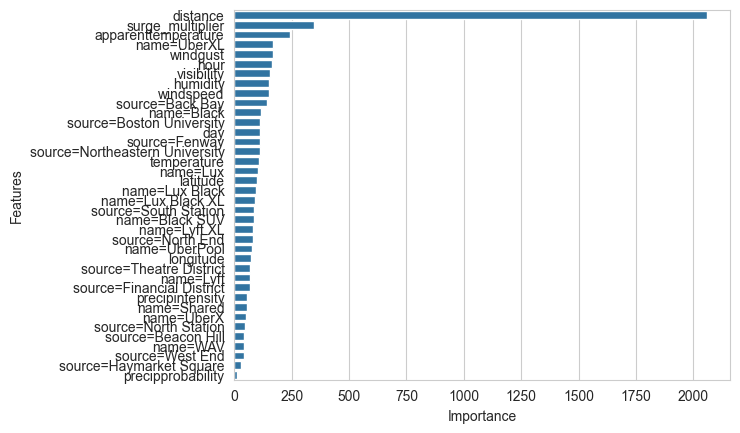

In [78]:
feature_importance = gbm.get_booster().get_score(importance_type='weight')
features = list(dv.get_feature_names_out())
importances = list(feature_importance.values())

data = pd.DataFrame({
    'Features': features,
    'Importance': importances
}).sort_values(by = 'Importance', ascending=False)
sns.barplot(data=data, y='Features', x='Importance')

In [79]:
pd.DataFrame(models_results).sort_values(by=['RMSE','time_sec'])

,model,RMSE,time_sec
9,xgb_n_estimators_100,1.687639,2.132391
8,random_forest_n_estimators_50,1.832947,269.895365
3,ridge_regression_alpha_0.01,2.512490,0.144329
0,ridge_regression_alpha_0.1,2.512490,0.146552
1,ridge_regression_alpha_1,2.512494,0.155364
2,ridge_regression_alpha_10,2.512535,0.147930
7,lasso_regression_alpha_0.001,2.512610,4.443903
6,lasso_regression_alpha_0.01,2.520612,0.727292
5,lasso_regression_alpha_0.1,2.942961,0.431290
4,lasso_regression_alpha_1,7.943842,0.336986


Both RandomForestRegressor and XGBRegressor are performing well but Random Forest takes much more time to run which may be the issue for the model in the production. That's why, we will proceed with the XGBRegressor algrorithm.

## XGBoost parameter tuning

In [254]:
from sklearn.model_selection import GridSearchCV


def train_xgboost(X_train, y_train, X_val, y_val):
    # Set up the parameter grid
    param_grid = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7],
        'subsample': [0.8, 1.0],
        'colsample_bytree': [0.8, 1.0]
    }

    
    gbm = xgb.XGBRegressor(random_state=42)

    grid_search = GridSearchCV(estimator=gbm, param_grid=param_grid,
                               scoring='neg_mean_squared_error', cv=5, verbose=1)

    start_time = time.time()

    grid_search.fit(X_train, y_train)

    end_time = time.time()

    print(f'Best parameters: {grid_search.best_params_}')

    # Evaluate the best model on the validation data
    best_gbm = grid_search.best_estimator_
    gbm_pred = best_gbm.predict(X_val)
    rmse = mean_squared_error(y_val, gbm_pred, squared=False)
    time_count = end_time - start_time

    print(f'GBM RMSE: {rmse}')
    print(f'Time taken: {time_count} seconds')

    return best_gbm

In [255]:
best_gbm = train_xgboost(X_train, y_train, X_val, y_val)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 200, 'subsample': 1.0}
GBM RMSE: 1.6703227636728986
Time taken: 664.7786889076233 seconds


In [256]:
best_gbm

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=1.0, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [259]:
gbm = xgb.XGBRegressor(colsample_bytree=1.0,
                           learning_rate=0.2,
                           max_depth=7,
                           n_estimators=200, 
                           subsample=1.0,
                           random_state=42)
gbm.fit(X_train, y_train)
gbm_pred = gbm.predict(X_val)
rmse = mean_squared_error(y_val, gbm_pred, squared=False)
print(f"GBM RMSE: {rmse}")

GBM RMSE: 1.6703227636728986


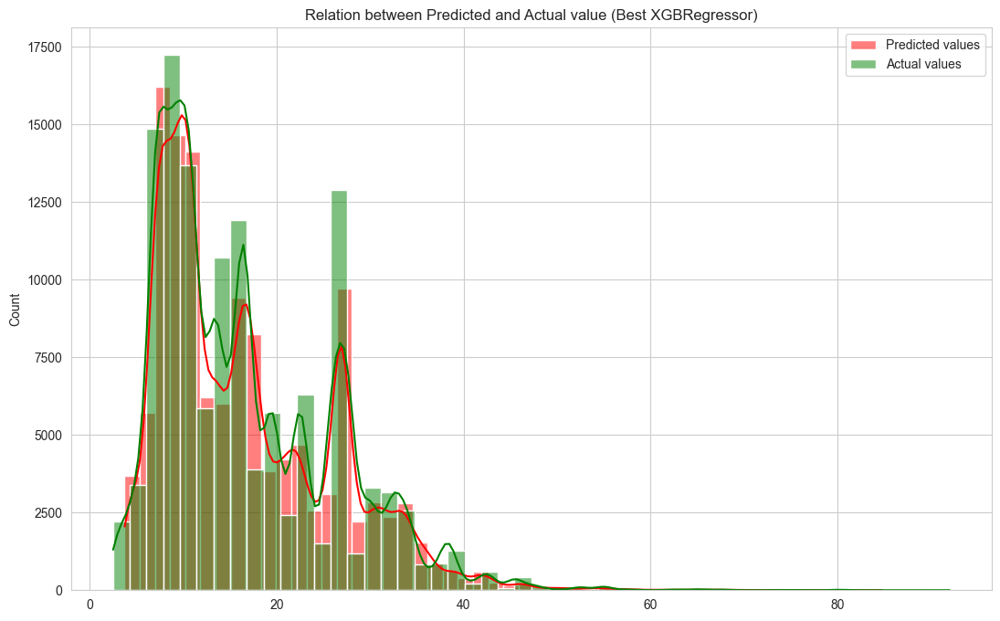

In [265]:
plt.figure(figsize=(13, 8))
sns.histplot(gbm_pred, color="red", label='Predicted values', bins=50, kde=True)
sns.histplot(y_val, color="green", label='Actual values', bins=50, kde=True)
plt.title("Relation between Predicted and Actual value (Best XGBRegressor)")
plt.legend()
plt.show()

## Training on the full train set

In [280]:
dv, X_full_train, X_test = prepare_df(df_full_train, df_test, train_cols)
gbm = xgb.XGBRegressor(colsample_bytree=1.0,
                           learning_rate=0.2,
                           max_depth=7,
                           n_estimators=200, 
                           subsample=1.0,
                           random_state=42)
gbm.fit(X_full_train, y_full_train)
# Get indices of rows with non-null target values
valid_indices = ~np.isnan(y_test)

# Filter out rows with null target values
X_test_notna = X_test[valid_indices]
y_test_notna = y_test[valid_indices]

gbm_pred = gbm.predict(X_test)
gbm_pred_notna = gbm_pred[valid_indices]
rmse_test = mean_squared_error(y_test_notna, gbm_pred_notna, squared=False)
print(f"GBM on the test set gives RMSE: {rmse_test}")

GBM on the test set gives RMSE: 1.6628192992548525


Great! On the test data, we got even a bit lower RMSE!

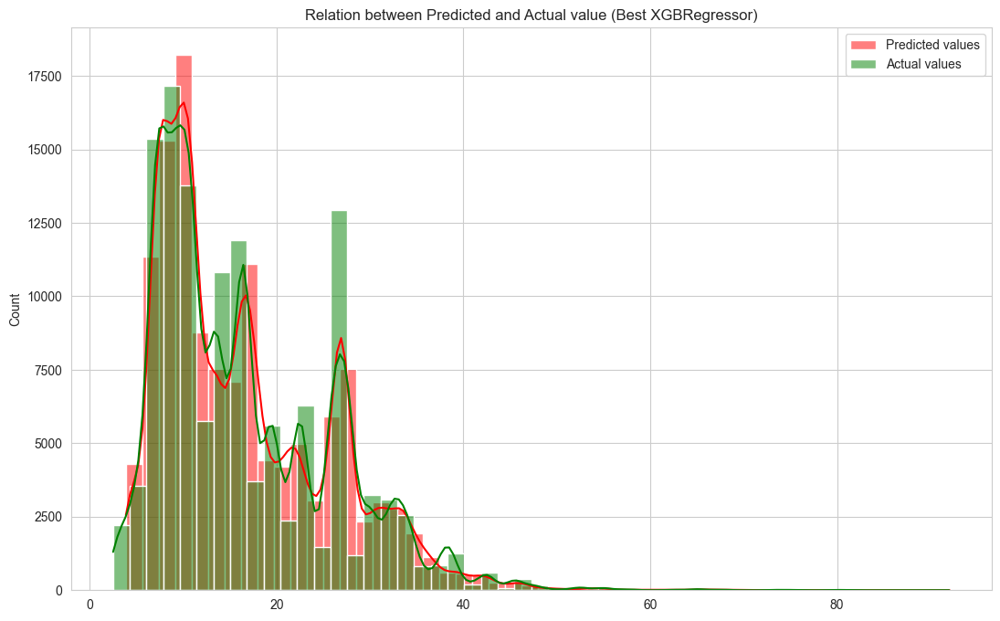

In [281]:
plt.figure(figsize=(13, 8))
sns.histplot(gbm_pred_notna, color="red", label='Predicted values', bins=50, kde=True)
sns.histplot(y_test_notna, color="green", label='Actual values', bins=50, kde=True)
plt.title("Relation between Predicted and Actual value (Best XGBRegressor)")
plt.legend()
plt.show()

## Saving the final model

In [282]:
import pickle

In [283]:
output_file = 'price_prediction.bin'

In [284]:
with open(output_file,'wb') as f_out: 
    pickle.dump((dv, gbm), f_out)